# Mounting and Loading Dataset



In [ ]:

def mount():
  from google.colab import drive
  drive.flush_and_unmount()
  drive.mount("/content/gdrive")

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/gdrive


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


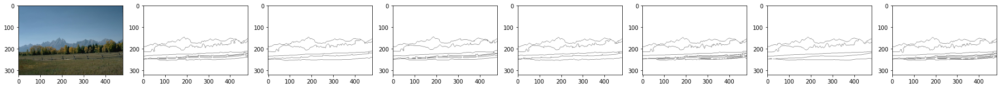

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import scipy.io as sc
from  scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.neighbors import kneighbors_graph


trainSizes=[]
testSizes=[]




def get_groundTruth(path):
    truths=[]
    """
    return the nparray of boundary (0 for boundary and 255 for area)
    :param path:
    :return:
    """
    mat = sc.loadmat(path)
    groundTruth = mat.get('groundTruth')
    label_num = groundTruth.size

    for q in range(label_num):
              boundary = groundTruth[0][q]['Boundaries'][0][0]
              trueBoundary = boundary

              height = trueBoundary.shape[0]
              width = trueBoundary.shape[1]
              trueBoundary = trueBoundary.reshape(height, width, 1)
              trueBoundary = 255 * np.ones([height, width, 1], dtype="uint8") - (trueBoundary > 0) * 255

              truths.append(trueBoundary)

    return truths
















def loadDataset(folder):
    # folder="gdrive/MyDrive/berkleyDataset/train"
    trainImages = []
    names=[]
    # for filename in os.listdir(folder):
    #   names.append(filename)
    
    names = os.listdir(folder)
    names = sorted(names,key=lambda x: int(os.path.splitext(x)[0]))    

    for name in names:
        trainImg = cv2.imread(os.path.join(folder,name),cv2.IMREAD_COLOR)
        trainImg=cv2.cvtColor(trainImg, cv2.COLOR_BGR2RGB)
        if trainImg is not None:
            x,y,z=np.shape(trainImg)
            trainSizes.append(np.shape(trainImg))
            trainImg=trainImg.reshape(x*y,3)
            trainImages.append(trainImg)
    return np.array(trainImages)





def loadGround(folder):
  trainGround=[]
  names = os.listdir(folder)
  names = sorted(names,key=lambda x: int(os.path.splitext(x)[0])) 
  for name in names:
        trainMat=sc.loadmat(os.path.join(folder,name))
        if trainMat is not None:
            x=get_groundTruth(os.path.join(folder,name))
            trainGround.append(x)

  return np.asarray(trainGround)   









mount()
trainDataset=loadDataset("gdrive/MyDrive/berkleyDataset/train")
testDataset=loadDataset("gdrive/MyDrive/berkleyDataset/test")
testGround=loadGround("gdrive/MyDrive/berkleyDataset/ground truth/test")
# print(np.shape(testGround))
trainGround=loadGround("gdrive/MyDrive/berkleyDataset/ground truth/train")
# print(np.shape(trainGround))
# print(np.shape(trainGround[0]))
trainSizes=np.array(trainSizes)        
testSizes=np.array(testSizes)        

images=trainGround[0]
img2=trainDataset[0].reshape(trainSizes[0])
f, axarr = plt.subplots(1,len(images)+1)
f.set_figheight(25)
f.set_figwidth(25)
axarr[0].imshow(img2)
index=1;
for i  in range(len(images)):
  axarr[index].imshow(images[i].reshape((trainSizes[0,0],trainSizes[0,1])),cmap='gray')
  if index<len(images):
    index=index+1;

f.tight_layout()


# Segmentation using K-means



k-means iterations

In [ ]:
def kmean(clusters,trainGraph):
  kmeans = KMeans(n_clusters=clusters,random_state=42).fit(trainGraph)
   #print(kmeans.predict(testGraph))
  return kmeans.predict(trainGraph)
clusteredImages=[]
clusters=[3,5,7,9,11]
for i in range(50):
  predictedImages=[]
  rgbTrain=[]
  rTrain=trainDataset[i,:,0]
  gTrain=trainDataset[i,:,1]
  bTrain=trainDataset[i,:,2]
  rgbTrain.append(rTrain)
  rgbTrain.append(gTrain)
  rgbTrain.append(bTrain)

  rgbTest=[]
  rTest=testDataset[i,:,0]
  gTest=testDataset[i,:,1]
  bTest=testDataset[i,:,2]
  rgbTest.append(rTest)
  rgbTest.append(gTest)
  rgbTest.append(bTest)


  for i in range(len(clusters)):
    predictedImages.append(kmean(clusters[i],np.array(rgbTrain).T))
  
  predictedImages=np.array(predictedImages)

  clusteredImages.append(predictedImages)


  

  




(5, 154401)


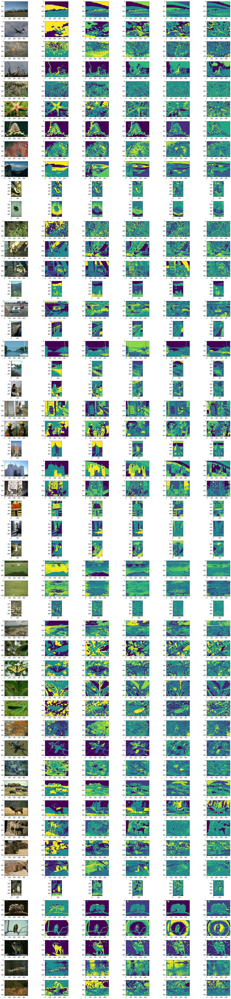

In [ ]:
print(np.shape(np.array(predictedImages)))


# trueBoundary = 255 * np.ones([height, width, 1], dtype="uint8") - (trueBoundary > 0) * 255
f, axarr = plt.subplots(50,len(clusters)+1)
f.set_figheight(100)
f.set_figwidth(25)
for x in range(50):

  width = trainSizes[x,0]
  height = trainSizes[x,1]
  imgs=clusteredImages[x]
  axarr[x,0].imshow(trainDataset[x].reshape((trainSizes[x])))
  index=1;
  for i  in range(len(clusters)):
    trueBoundary = imgs[i].reshape(width, height)
    axarr[x,index].imshow(trueBoundary)
    if index<len(images):
      index=index+1;

f.tight_layout()


# External measures 
 

Entropy

In [ ]:
from collections import Counter
import math
def entropy(Y):
        e = 0.
        total = len(Y)
        if total <= 1:
            return 0
        for num in Counter(Y).values():
            p = num/total
            e -= p * math.log2(p)
        return e 


def indices(v,Y):
  return [i for i, j in enumerate(Y) if j == v]


def conditional_entropy(Y,X):
        ce = 0.
        total = len(Y)
        for label in Counter(X).keys():
            sv = [Y[i] for i in indices(label,X)]
            e = entropy(sv)
            ce += e * len(sv)/total
        return ce


imageEntropiesMean=[]
imageEntropiesSegments=[]
for i in range(50):
  imgs=clusteredImages[i]
  truths=trainGround[i]
  meanEntropiesPerImage=[]
  entropiesPerImage=[]
  for j in range(len(clusters)):
    entropiesPerCluster=[]

    for k in range(len(trainGround[i])):
      entropySegment=conditional_entropy(truths[k].flatten(),imgs[j].flatten())
      entropiesPerCluster.append(entropySegment)

    mean=np.mean(entropiesPerCluster)
    meanEntropiesPerImage.append(mean)
    entropiesPerImage.append(entropiesPerCluster)

    
  meanEntropiesPerImage=np.array(meanEntropiesPerImage)
  entropiesPerImage = np.array(entropiesPerImage)
  
  imageEntropiesMean.append(meanEntropiesPerImage)
  imageEntropiesSegments.append(entropiesPerImage)




KeyboardInterrupt: ignored

F-Measure

In [ ]:
#print(np.shape(imageEntropiesMean)) == 50*5
#print(imageEntropiesSegments)==  50*5*no.ofSegments
from sklearn.metrics import precision_recall_fscore_support as score


imageFMean=[]
imageFSegments=[]
for i in range(50):
  imgs=clusteredImages[i]
  truths=trainGround[i]
  meanFPerImage=[]
  FPerImage=[]
  for j in range(len(clusters)):
    FPerCluster=[]

    for k in range(len(trainGround[i])):
      _,_,FSegment,_=score(truths[k].flatten(),imgs[j].flatten(),average=None)
      FPerCluster.append(FSegment)

    mean=np.mean(FPerCluster)
    meanFPerImage.append(mean)
    FPerImage.append(FPerCluster)

    
  meanFPerImage=np.array(meanFPerImage)
  FPerImage = np.array(FPerImage)
  
  imageFMean.append(meanFPerImage)
  imageFSegments.append(FPerImage)




/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [ ]:
# print(imageEntropiesMean)
print(imageFMean)
print("*************************")
print("*************************")
print("*************************")
print("*************************")
print("*************************")
print("*************************")
print(imageFSegments)

[array([0.00581964, 0.00121523, 0.00095784, 0.00107824, 0.00112827]), array([0.00633599, 0.001516  , 0.00101633, 0.00087983, 0.00064886]), array([0.00228098, 0.00168556, 0.00099032, 0.00169789, 0.00138341]), array([0.00855228, 0.00501363, 0.00441642, 0.00378427, 0.00216128]), array([0.01542393, 0.00999157, 0.00714977, 0.00555205, 0.00374196]), array([0.00869233, 0.00525883, 0.00497696, 0.00242028, 0.00158519]), array([0.00365014, 0.00127144, 0.00077813, 0.00092906, 0.00323005]), array([0.00340133, 0.00175911, 0.00427502, 0.00316319, 0.0023055 ]), array([0.00693463, 0.00488958, 0.00735829, 0.00253449, 0.00183729]), array([0.0112912 , 0.00592335, 0.00475345, 0.00452173, 0.00352302]), array([0.00231731, 0.00071035, 0.00061834, 0.00054742, 0.00359488]), array([0.00685948, 0.004806  , 0.00317992, 0.00260139, 0.00199904]), array([0.00870689, 0.00530293, 0.00418468, 0.00342545, 0.00288063]), array([0.00913288, 0.00542838, 0.00493523, 0.00541053, 0.00301185]), array([0.00616205, 0.00642382, 0.

Show image and it's corresponding Segments & k-Means=5 result

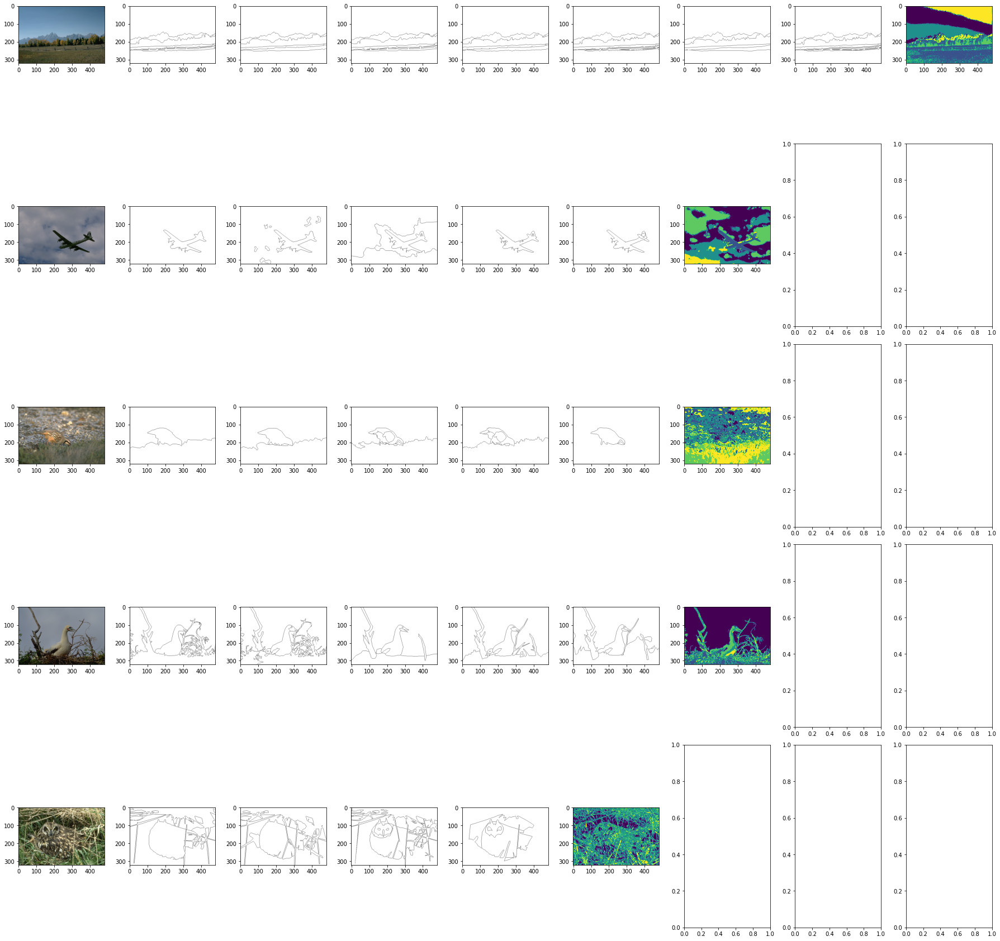

In [ ]:
f, axarr = plt.subplots(5,9,squeeze=False)
f.set_figheight(25)
f.set_figwidth(25)



for i in range(5):
  index=1;
  truths=trainGround[i]
  imgs=clusteredImages[i]
  clusteredImg=imgs[1]
  originalImg=trainDataset[i].reshape(trainSizes[i])
  axarr[i,0].imshow(originalImg)
  for j  in range(len(truths)):
    axarr[i,index].imshow(truths[j].reshape((trainSizes[i,0],trainSizes[i,1])),cmap='gray')
    if index<len(truths):
      index=index+1;
  axarr[i,len(truths)+1].imshow(clusteredImg.reshape(trainSizes[i,0],trainSizes[i,1]))

f.tight_layout()




# N-Cut

(154401, 3)
(2500, 3)
(154401, 3)
(2500, 3)
(154401, 3)
(2500, 3)
(154401, 3)
(2500, 3)
(154401, 3)
(2500, 3)


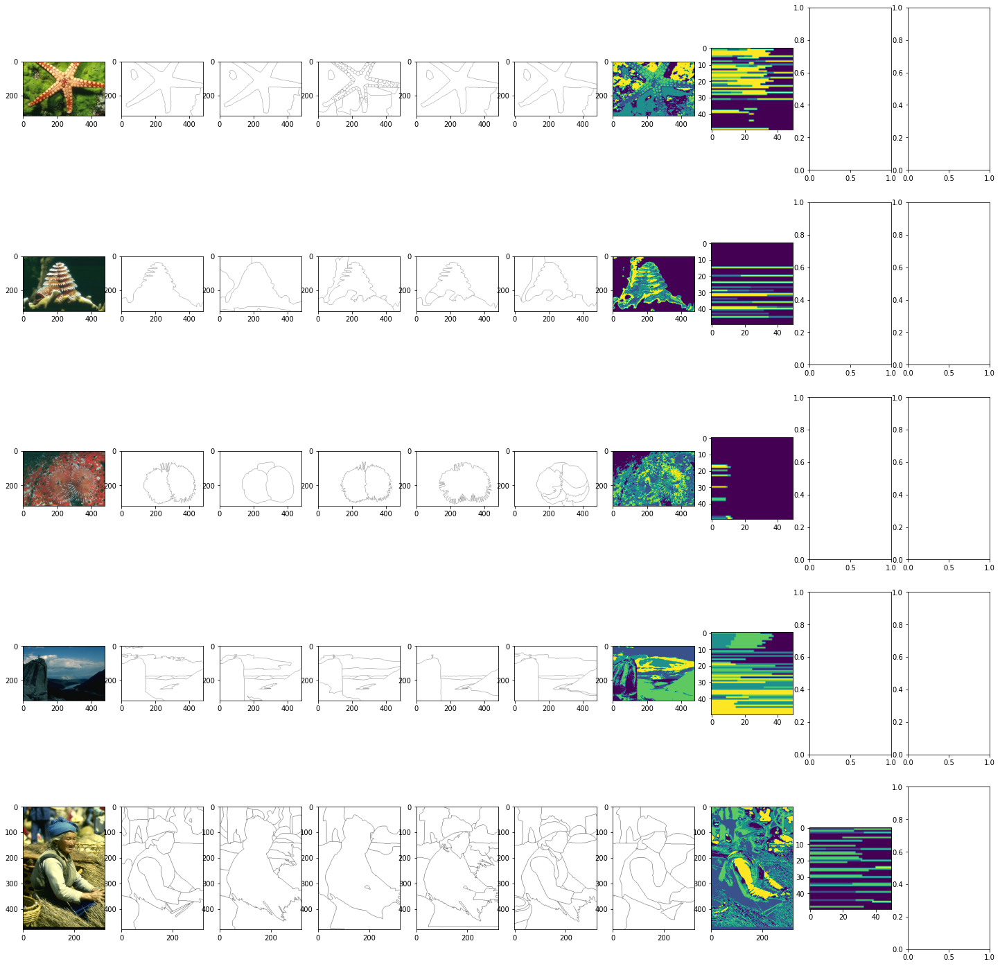

In [ ]:
from sklearn.neighbors import NearestNeighbors
import sklearn.metrics.pairwise as pw
import numpy as np
from scipy.sparse import csgraph
from numpy.linalg import eigh
from matplotlib import pyplot as plt
from sklearn.cluster import SpectralClustering

def kmean(clusters,trainGraph):
  kmeans = KMeans(n_clusters=clusters,random_state=42).fit(trainGraph)
   #print(kmeans.predict(testGraph))
  return kmeans.predict(trainGraph)

def spectralClusturing(similarity_matrix,k):
  
  degree_matrix = np.diag(np.real(np.sum(similarity_matrix, axis=1)))
  print(np.shape(degree_matrix))
  laplacian=degree_matrix-similarity_matrix
  LA=np.dot(degree_matrix.T,laplacian)
  
  eigen_values,eigen_vectors=eigh(LA)
  sortedIndices = np.argsort(eigen_values)
  chosen_vectors=[]
  for i in range(k):
    chosen_vectors.append(eigen_vectors[:,sortedIndices[i]])


  chosen_vectors=np.asarray(chosen_vectors).T
  print(np.shape(chosen_vectors))

  graph_data=[]

  for i in range(2500):
    norm=np.linalg.norm(chosen_vectors[i],axis=0)
    graph_data.append([chosen_vectors[i,0]/norm,chosen_vectors[i,1]/norm,chosen_vectors[i,2]/norm,chosen_vectors[i,3]/norm,chosen_vectors[i,4]/norm])

  return kmean(5,np.array(graph_data))







f, axarr = plt.subplots(5,10,squeeze=False)
f.set_figheight(25)
f.set_figwidth(25)
spectralImages=[]
for i in range(5):
  imgs=clusteredImages[i+5]
  clusteredKImg=imgs[1]
  rgbTrain=[]
  print(np.shape(trainDataset[i+5]))
  image=trainDataset[i+5].reshape(trainSizes[i+5])
  image=cv2.resize(trainDataset[i+5],(50,50))
  image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image=image.reshape(2500,3)

  # image = image.T
  rTrain=image[:,0]
  gTrain=image[:,1]
  bTrain=image[:,2]
  rgbTrain.append(rTrain)
  rgbTrain.append(gTrain)
  rgbTrain.append(bTrain)
  rgbTrain=np.array(rgbTrain).T
  print(np.shape(rgbTrain))
  index=1;
  truths=trainGround[i+5]
  # nbrs = NearestNeighbors(5).fit(rgbTrain)
  # sim_matrix=np.asarray(np.real(nbrs.kneighbors_graph(rgbTrain).toarray()))
  clusteredImg=SpectralClustering(n_clusters=5,n_neighbors=5,assign_labels="kmeans").fit(rgbTrain)
  aff_matrix=clusteredImg.affinity_matrix_
  spectralImages.append(clusteredImg)
  originalImg=trainDataset[i+5].reshape(trainSizes[i+5])

  axarr[i,0].imshow(originalImg)
  for j  in range(len(truths)):
    axarr[i,index].imshow(truths[j].reshape((trainSizes[i+5,0],trainSizes[i+5,1])),cmap='gray')
    if index<len(truths):
      index=index+1;
      
  trueBoundary = clusteredImg.labels_.reshape(50, 50)
  axarr[i,len(truths)+1].imshow(clusteredKImg.reshape(trainSizes[i+5,0],trainSizes[i+5,1]))
  # trueBoundary = np.uint8(np.zeros((len(img), len(img[0]), n_features)))  
  axarr[i,len(truths)+2].imshow(trueBoundary)



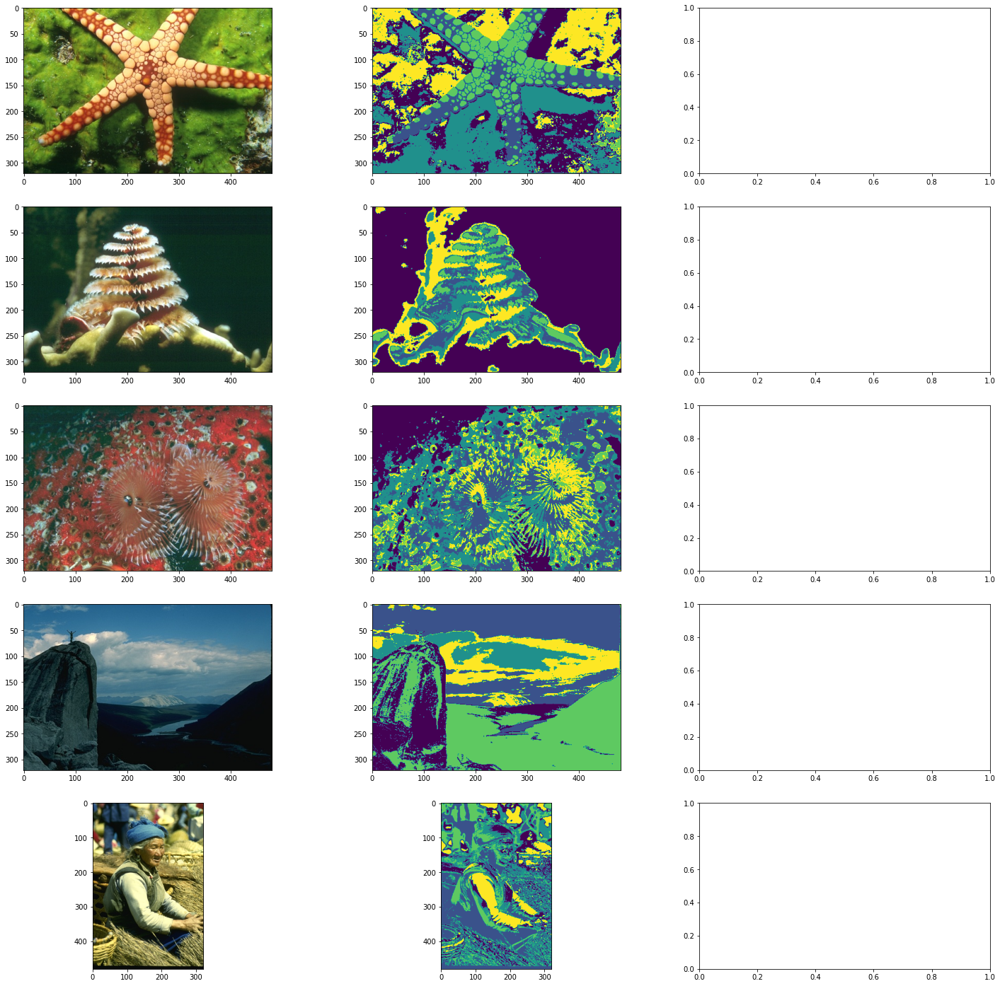

In [ ]:
f, axarr = plt.subplots(5,3,squeeze=False)
f.set_figheight(25)
f.set_figwidth(25)
#print(spectralImages)
#print(spectralImages.labels_)
for i in range(5):
  imgs=clusteredImages[i+5]
  clusteredImg=imgs[1]
  axarr[i,0].imshow(trainDataset[i+5].reshape(trainSizes[i+5]))
  axarr[i,1].imshow(clusteredImg.reshape(trainSizes[i+5,0],trainSizes[i+5,1]))
  #axarr[i,2].imshow(spectralImages[i].labels_.reshape(50,50))



